# 시계열 데이터 회귀분석 - 가정 소비 전력 데이터

In [1]:
# 문제 정의 - 데이터 수집 - 데이터 처리 - 데이터 분석 - 리포팅 및 피드백

## 0. 분석 배경
- World Energy Outlook 2017 논문에 따르면 급격한 경제 성장과 인구 증가는 에너지 소비를 증가시킴.
- 한국에서는 2016년 8518만㎾ → 2017년 8650만㎾ → 2018년 9248만㎾와 같이 전력 소비가 증가 추세를 보이고 있음. 18년도는 전력대란 임박.
- 에너지 소비는 한번에 집중되는 경향이 있어 적절한 전력 수요 예측은 매우 중요.
- 사회, 경제적으로 중요한 전력 소비 중 27%가 가정에서 발생.

## 1. 문제 정의

- 분석 목적: 일반적인 데이터는 보통 시계열 속성을 가짐. 시계열 데이터를 선형회귀분석에서 활용할 수 없을지 고민.
    초 단위로 변화하는 전력량은 시계열 데이터 회귀분석을 위한 가장 적합한 데이터라고 생각해 선택.
    특히 소비 전력량을 정확히 예측하면 이에 맞는 전력 계획을 수립함으로 돌발 상황에 대처할 수 있음.
    전력량 데이터를 슬라이딩 윈도우(Sliding Window) 기법을 활용해 선형 회귀분석할 계획.
- 가설 수립: 직전의 전력량은 직후의 전력량에 영향을 미칠 것이다
    전력량은 겨울에서 봄, 여름에서 가을로 갈수록 낮아지고, 봄에서 여름, 가을에서 겨울로 갈수록 높아질 것이다. 여름의 전력량이 가장 클 것이다

## 2. 데이터 수집

- UC Irvine Machine Learning Repository 데이터
    - https://archive.ics.uci.edu/ml/datasets/Individual+household+electric+power+consumption
- 2006년 12월부터 2010년 11월까지 47개월 동안 프랑스 파리에서 약 7km 떨어진 주거 도시 소(Sceaux) 내에 있는 한 일반 가정집의 소비 전력 시계열 데이터 207만5259건.
- 일부 컬럼에서 약 1.25%의 결측치 포함

## 3. 데이터 처리

### 3.1 CSV 파일 로드

In [53]:
import warnings
warnings.filterwarnings(action = "ignore") # 경고 무시
import pandas as pd

In [54]:
power = pd.read_csv("household_power_consumption.txt", sep=";", header=0, low_memory=False, infer_datetime_format=True, parse_dates={"datetime":[0,1]}, index_col=["datetime"])

In [55]:
# dataset 안의 ?를 nan으로 바꿔줌
from numpy import nan
from numpy import isnan
power.replace('?', nan, inplace=True)

# 데이터 타입 실수로 변환
power = power.astype("float32")

In [56]:
power.tail(100)

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2010-11-26 19:23:00,1.070,0.000,239.610001,4.4,0.0,0.0,0.0
2010-11-26 19:24:00,1.120,0.082,238.910004,4.6,0.0,0.0,0.0
2010-11-26 19:25:00,1.126,0.078,237.990005,4.8,0.0,0.0,0.0
2010-11-26 19:26:00,1.264,0.072,237.229996,5.4,0.0,0.0,0.0
2010-11-26 19:27:00,1.260,0.000,236.139999,5.4,0.0,0.0,0.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.429993,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.000,240.000000,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.000,239.820007,3.8,0.0,0.0,0.0


In [57]:
power.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2075259 entries, 2006-12-16 17:24:00 to 2010-11-26 21:02:00
Data columns (total 7 columns):
Global_active_power      float32
Global_reactive_power    float32
Voltage                  float32
Global_intensity         float32
Sub_metering_1           float32
Sub_metering_2           float32
Sub_metering_3           float32
dtypes: float32(7)
memory usage: 71.2 MB


- 데이터 설명
    - 1.date: Date in format dd/mm/yyyy
    - 2.time: time in format hh:mm:ss
    - 3.global_active_power(유효전력): household global minute-averaged active power (in kilowatt)
    - 4.global_reactive_power(무효전력): household global minute-averaged reactive power (in kilowatt)
    - 5.voltage(전압): minute-averaged voltage (in volt)
    - 6.global_intensity(전류): household global minute-averaged current intensity (in ampere)
    - 7.sub_metering_1: energy sub-metering No. 1 (in watt-hour of active energy). It corresponds to the kitchen, containing mainly a dishwasher, an oven and a microwave (hot plates are not electric but gas powered).
    - 8.sub_metering_2: energy sub-metering No. 2 (in watt-hour of active energy). It corresponds to the laundry room, containing a washing-machine, a tumble-drier, a refrigerator and a light.
    - 9.sub_metering_3: energy sub-metering No. 3 (in watt-hour of active energy). It corresponds to an electric water-heater and an air-conditioner.

### 3.2 결측 데이터 확인

In [11]:
import missingno as msno

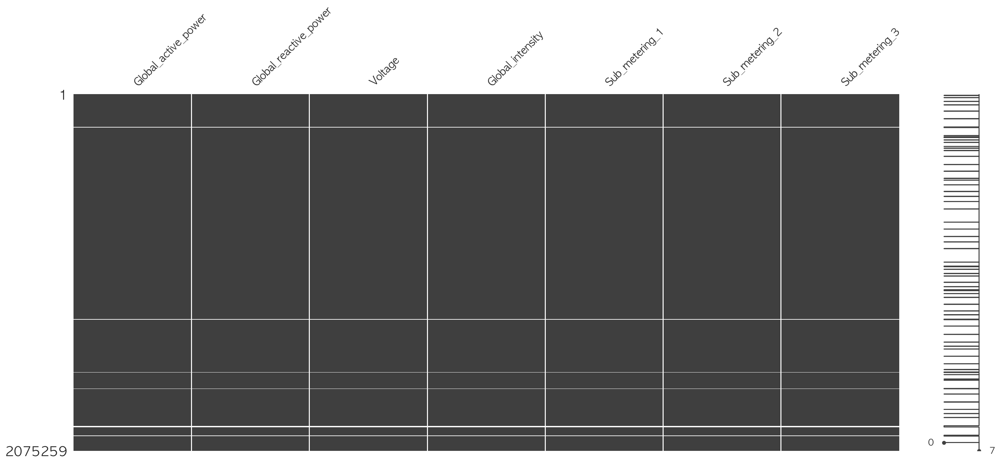

In [12]:
msno.matrix(power)
#msno.bar(power)

### 3.3 결측데이터 대체(imputation)

In [195]:
# 거의 일정한 값을 가진 Voltage 독립변수를 제외한 다른 변수들은 당시의 시기(계절)에 따라 변화하는 값이므로 누락값을 전날 같은 시간대 값으로 대체해 처리

In [58]:
# 하루 전 같은 시간대 데이터로 누락값 대체
def fill_missing(values):
    one_day = 60 * 24
    for row in range(values.shape[0]):
        for col in range(values.shape[1]):
            if isnan(values[row, col]):
                values[row, col] = values[row - one_day, col]
                
fill_missing(power.values)

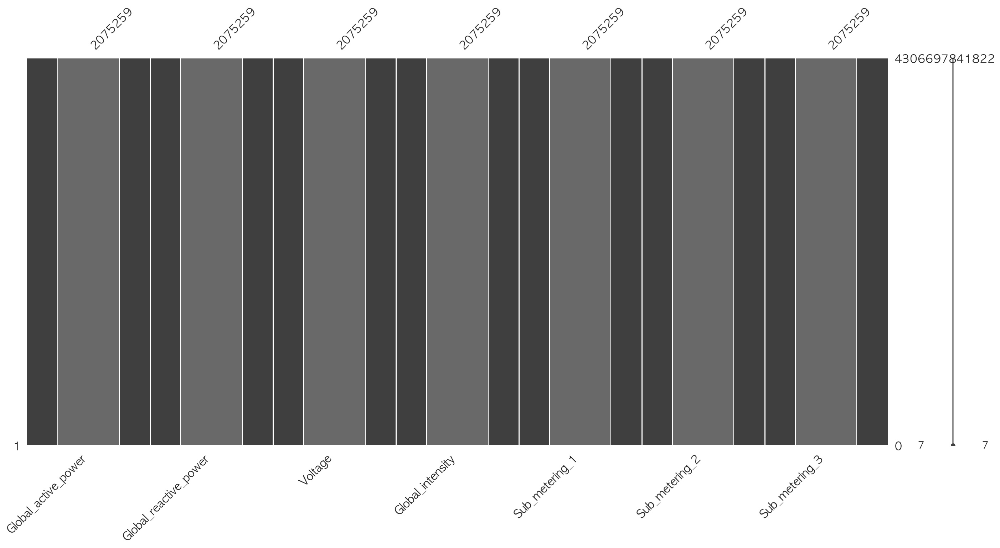

In [14]:
msno.matrix(power)
msno.bar(power)

### 3.4 sub_metering_4 추가

In [59]:
# sub_metering_4 컬럼 추가
# (global_active_power*1000/60 - sub_metering_1 - sub_metering_2 - sub_metering_3) represents the active energy consumed every minute (in watt hour) in the household by electrical equipment not measured in sub-meterings 1, 2 and 3.
values = power.values
power["sub_metering_4"] = (values[:,0] * 1000 / 60) - (values[:,4] + values[:,5] + values[:,6])

In [60]:
# 지금까지 한 내용들을 csv 파일로 1차 저장
power.to_csv("household_power_consumption.csv")

### 3.5 resolution 조정

In [18]:
# 시간 단위로 레졸루션 조정
time_resolution = "H"
power_resampled = power.resample(time_resolution).mean()

# summarize
print(power_resampled.shape)
print(power_resampled.head())
power_resampled.to_csv("household_power_consumption_%s.csv" %(time_resolution))

(34589, 8)
                     Global_active_power  Global_reactive_power     Voltage  \
datetime                                                                      
2006-12-16 17:00:00             4.222889               0.229000  234.643890   
2006-12-16 18:00:00             3.632200               0.080033  234.580170   
2006-12-16 19:00:00             3.400233               0.085233  233.232498   
2006-12-16 20:00:00             3.268567               0.075100  234.071503   
2006-12-16 21:00:00             3.056467               0.076667  237.158661   

                     Global_intensity  Sub_metering_1  Sub_metering_2  \
datetime                                                                
2006-12-16 17:00:00         18.100000             0.0        0.527778   
2006-12-16 18:00:00         15.600000             0.0        6.716667   
2006-12-16 19:00:00         14.503333             0.0        1.433333   
2006-12-16 20:00:00         13.916667             0.0        0.000000 

In [118]:
df_power = pd.read_csv("household_power_consumption_H.csv")
df_power.head(5)

,datetime,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,sub_metering_4
0,2006-12-16 17:00:00,4.222889,0.229000,234.64389,18.100000,0.0,0.527778,16.861110,52.992590
1,2006-12-16 18:00:00,3.632200,0.080033,234.58017,15.600000,0.0,6.716667,16.866667,36.953335
2,2006-12-16 19:00:00,3.400233,0.085233,233.23250,14.503333,0.0,1.433333,16.683332,38.553890
3,2006-12-16 20:00:00,3.268567,0.075100,234.07150,13.916667,0.0,0.000000,16.783333,37.692780
4,2006-12-16 21:00:00,3.056467,0.076667,237.15866,13.046667,0.0,0.416667,17.216667,33.307777


## 4. 탐색적 데이터 분석(EDA)

### 4.1 추세분석

In [1]:
df = pd.read_csv('household_power_consumption.csv', header=0, infer_datetime_format=True, parse_dates=["datetime"], index_col=["datetime"])
df.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,sub_metering_4
datetime,,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0,52.266670
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0,72.333336
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0,70.566666
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0,71.800000
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0,43.100000


In [2]:
values = df.values
df["sub_metering_4"] = (values[:,0] * 1000 / 60) - (values[:,4] + values[:,5] + values[:,6])

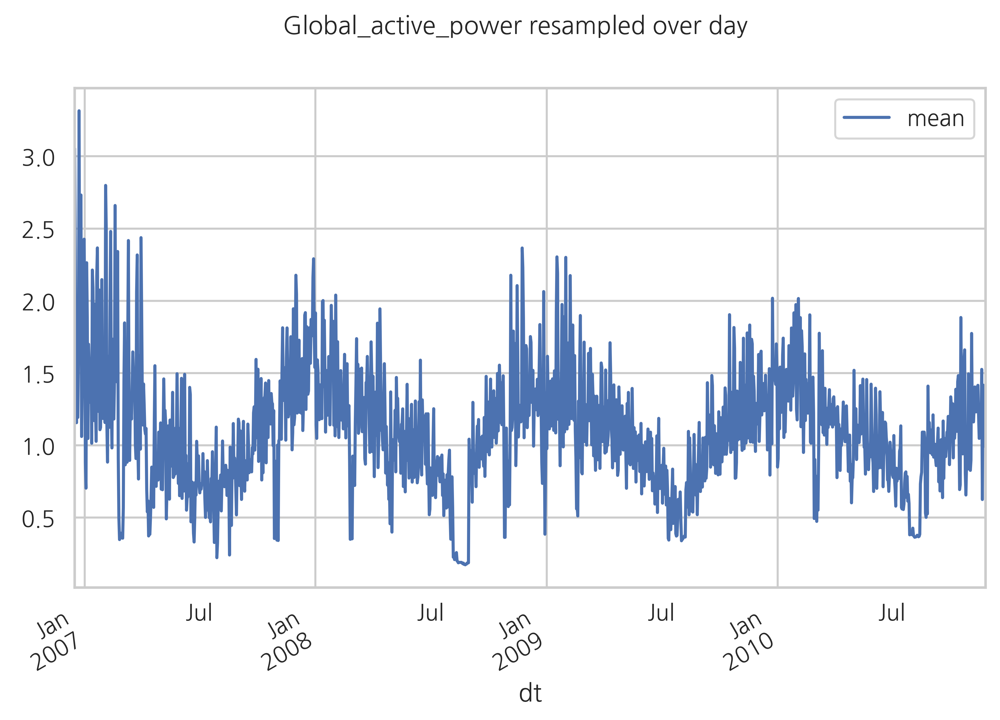

In [24]:
# 일자별 광역유효전력 평균
a = df.Global_active_power.resample('D').agg(['mean'])
a.plot(subplots = True, title='Global_active_power resampled over day') 
plt.show()

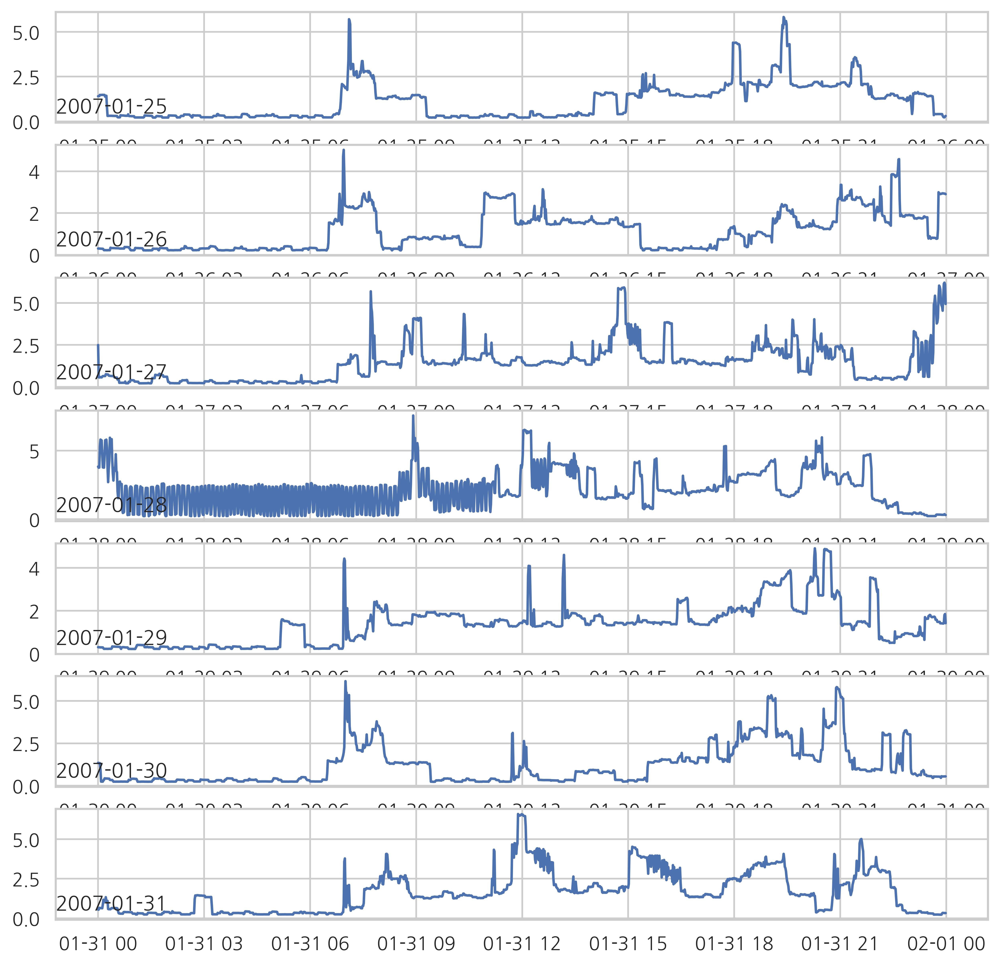

In [45]:
days = [x for x in range(25, 32)]
plt.figure(figsize=(10,10))
for i in range(len(days)):
    ax = plt.subplot(len(days), 1, i+1)
    day = '2007-01-' + str(days[i])
    result = df[day]
    plt.plot(result['Global_active_power'])
    plt.title(day, y=0, loc='left')
plt.show()

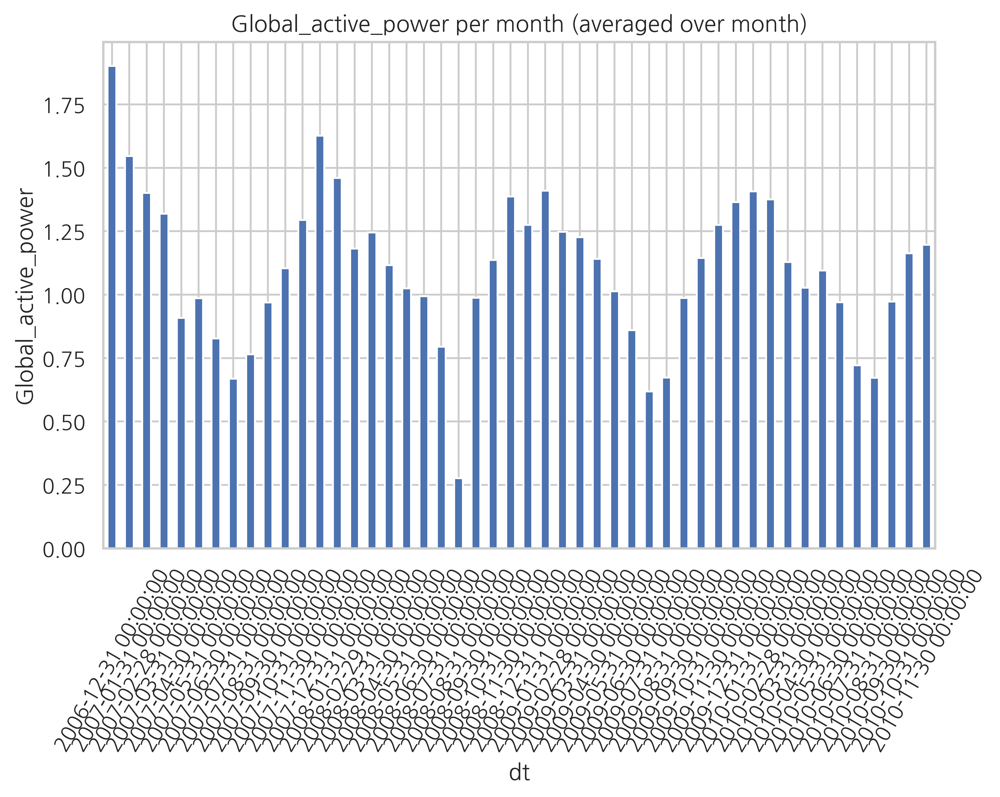

In [25]:
# 월별 광역유효전력 평균
df['Global_active_power'].resample('M').mean().plot(kind='bar')
plt.xticks(rotation=60)
plt.ylabel('Global_active_power')
plt.title('Global_active_power per month (averaged over month)')
plt.show()

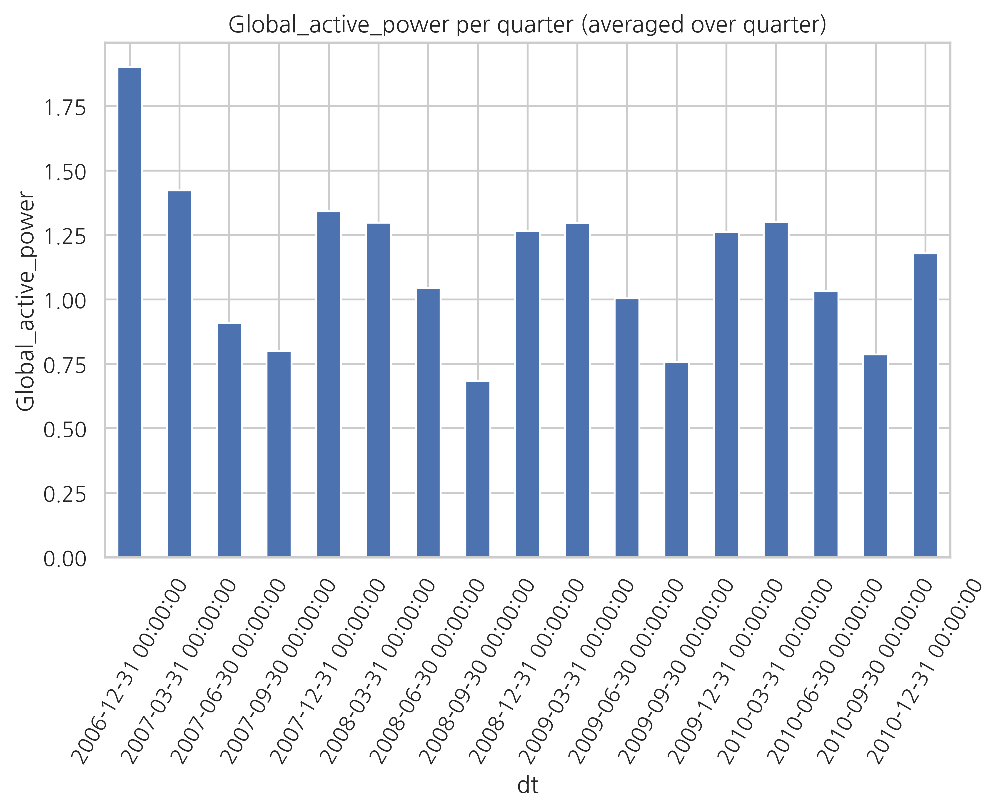

In [26]:
## 분기별 광역전력 평균
df['Global_active_power'].resample('Q').mean().plot(kind='bar')
plt.xticks(rotation=60)
plt.ylabel('Global_active_power')
plt.title('Global_active_power per quarter (averaged over quarter)')
plt.show()

In [27]:
df1 = df["2007"]
df2 = df["2008"]
df3 = df["2009"]
df4 = df["2010"]
df5 = pd.concat([df1, df2, df3, df4])

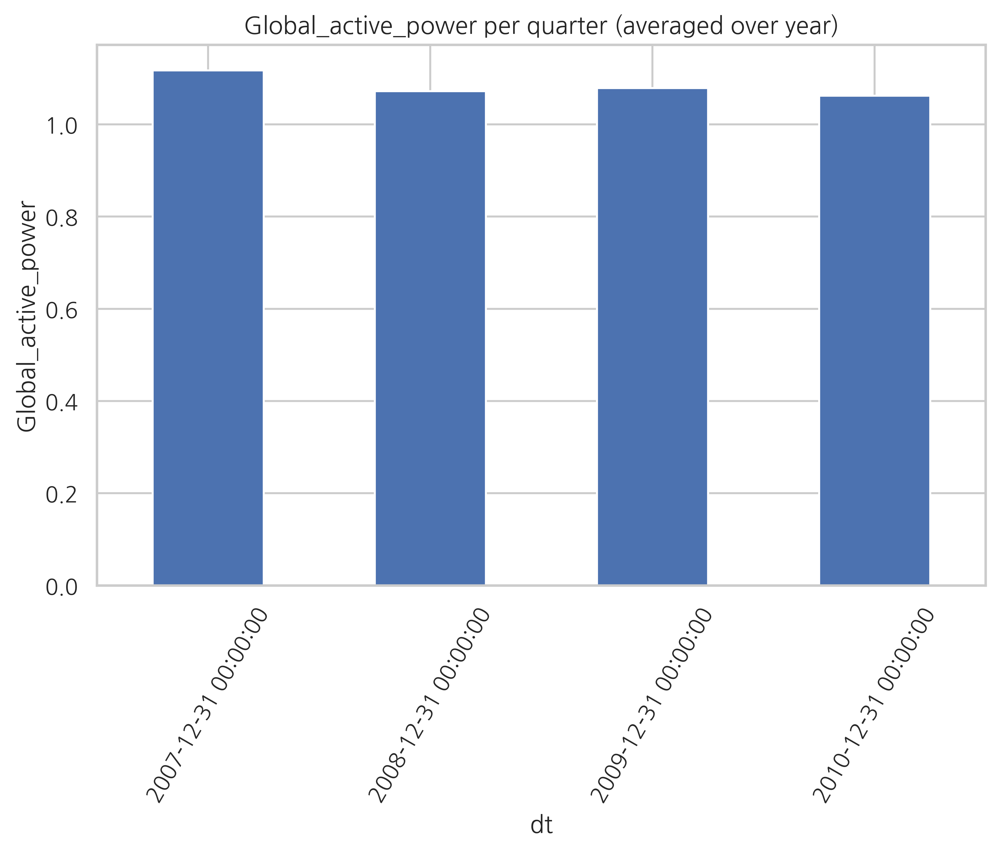

In [28]:
## 연도별 광역전력 평균
df5['Global_active_power'].resample('A').mean().plot(kind='bar')
plt.xticks(rotation=60)
plt.ylabel('Global_active_power')
plt.title('Global_active_power per quarter (averaged over year)')
plt.show()

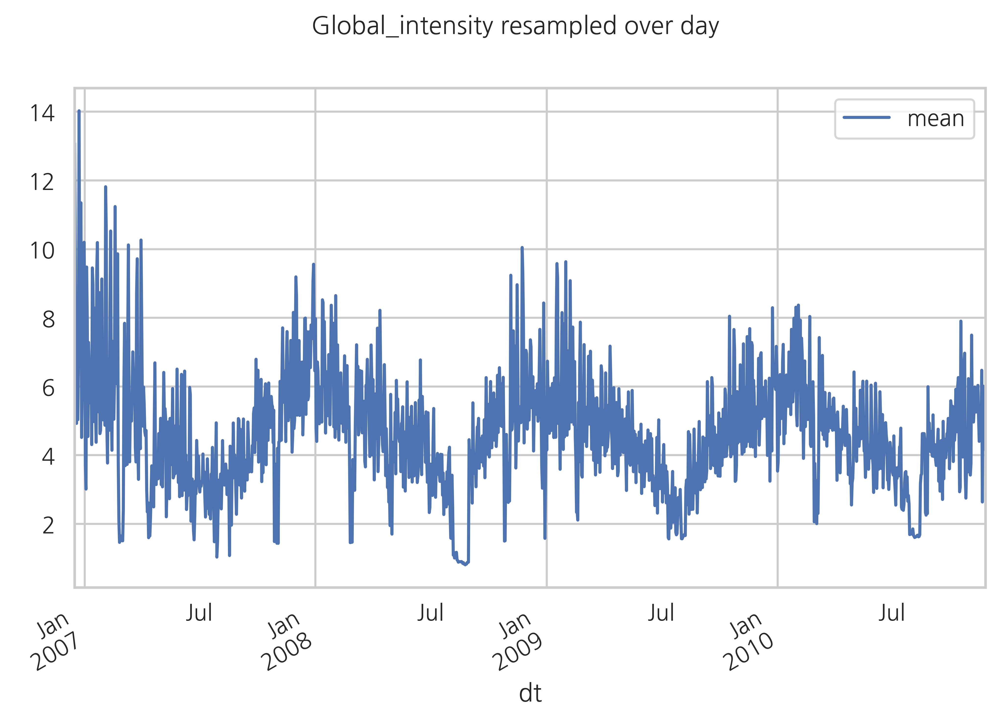

In [29]:
# 일자별 광역전류 평균
r = df.Global_intensity.resample('D').agg(['mean'])
r.plot(subplots = True, title='Global_intensity resampled over day')
plt.show()

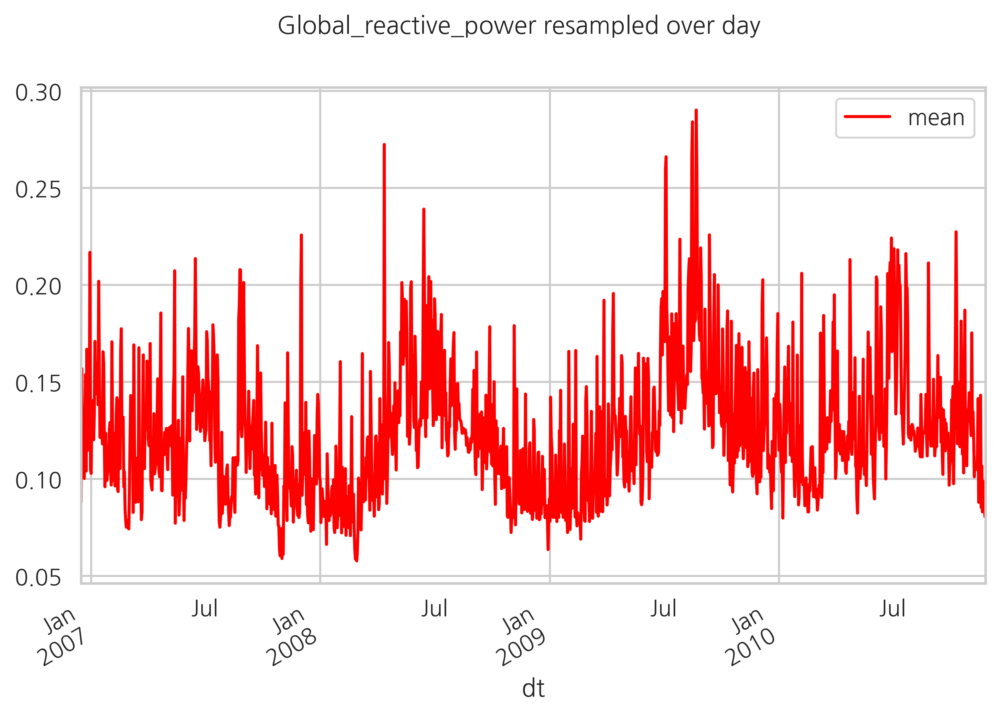

In [30]:
# 일자별 광역무효전력 평균
r2 = df.Global_reactive_power.resample('D').agg(['mean'])
r2.plot(subplots = True, title='Global_reactive_power resampled over day', color='red')
plt.show()

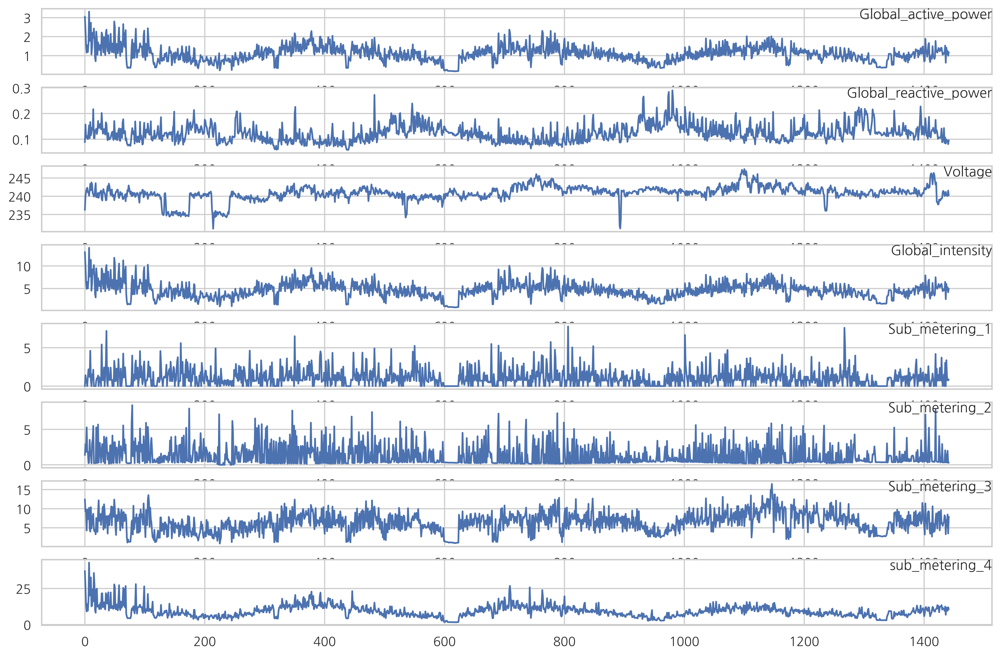

In [23]:
# mean of different features resampled over day. 
# specify columns to plot
cols = [0, 1, 2, 3, 4, 5, 6, 7]
i = 1
values = df.resample('D').mean().values
# plot each column
plt.figure(figsize=(15, 10))
for col in cols:
	plt.subplot(len(cols), 1, i)
	plt.plot(values[:, col])
	plt.title(df.columns[col], y=0.75, loc='right')
	i += 1
plt.show()

### 4.2 정규성 검증

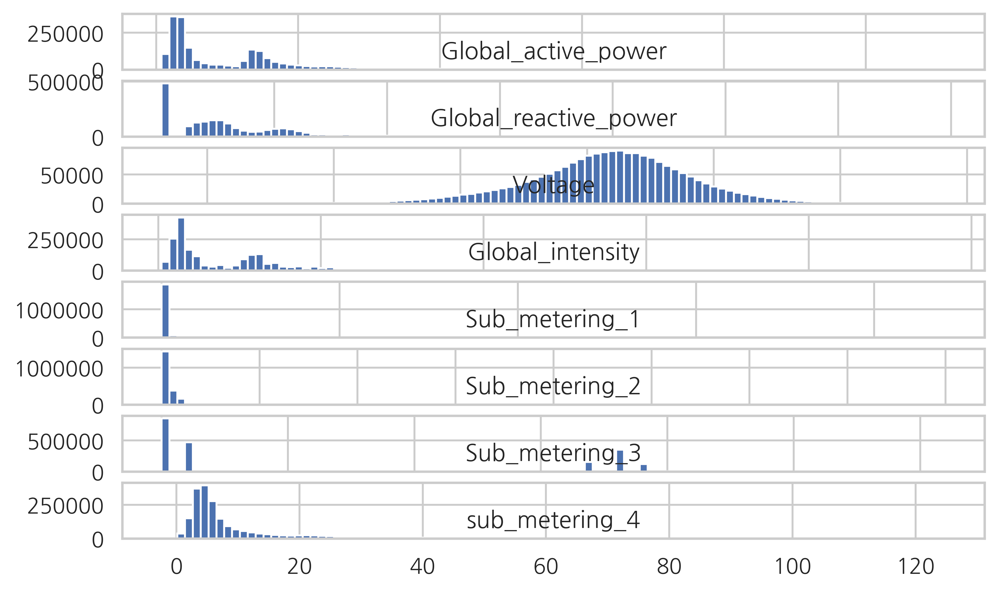

In [47]:
plt.figure()
for i in range(len(df.columns)):
    plt.subplot(len(df.columns), 1, i+1)
    name = df.columns[i]
    df[name].hist(bins=100)
    plt.title(name, y=0)
plt.show()

In [52]:
df.isnull().sum()

Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
sub_metering_4           25979
dtype: int64

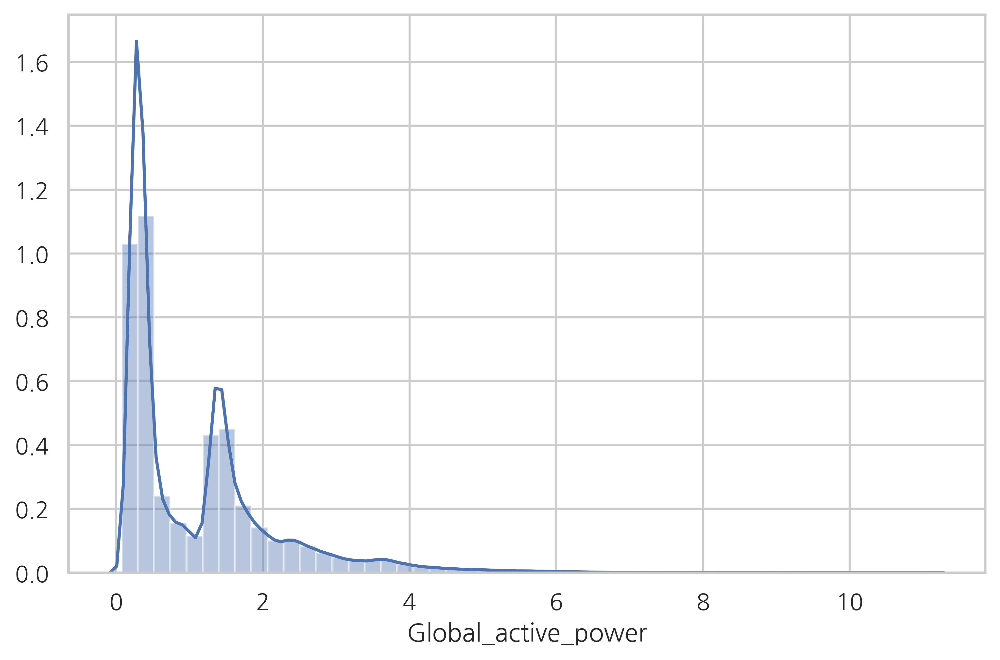

In [3]:
sns.distplot(df["Global_active_power"])

### 4.2 독립변수 간 상관관계 확인

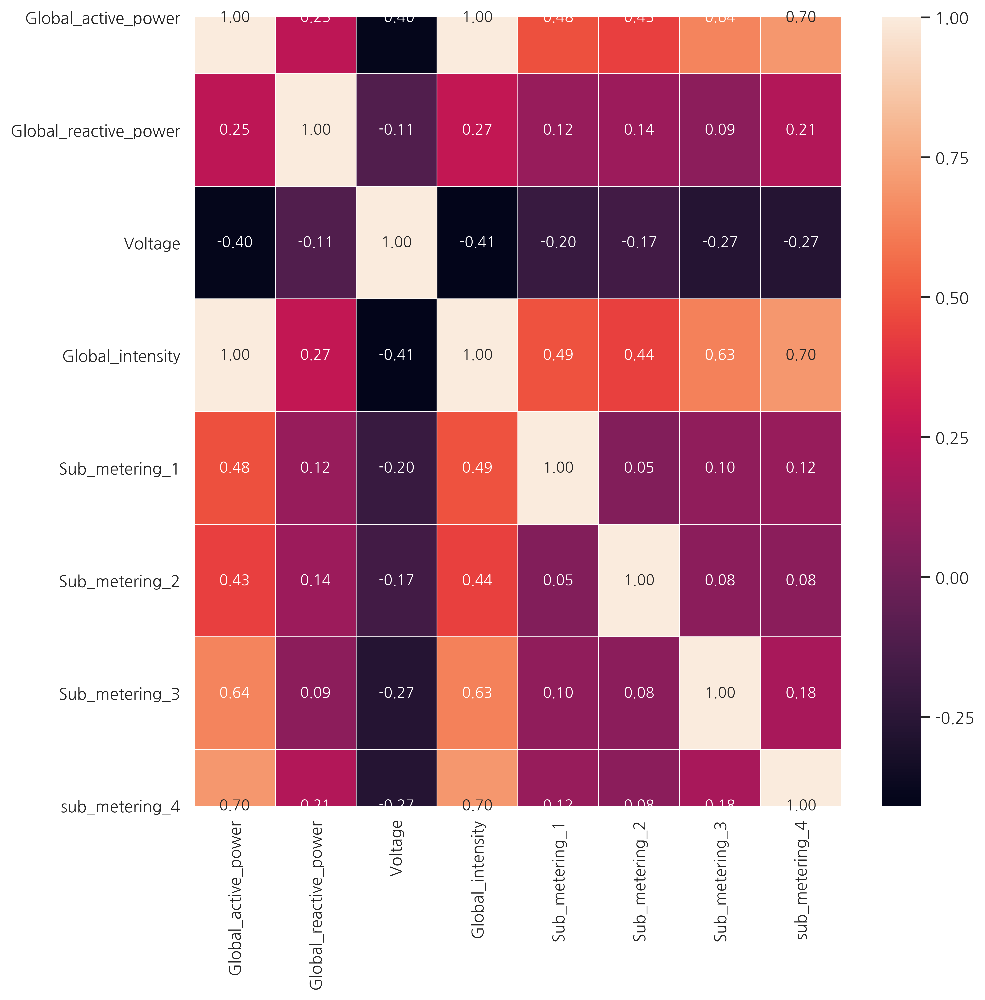

In [4]:
f,ax = plt.subplots(figsize = (10,10))
sns.heatmap(df.corr(), annot = True, linewidths = .5, fmt = ".2f", ax=ax)

## 5. 회귀분석

### 5.1 OLS

In [24]:
df_power = pd.read_csv("household_power_consumption_H.csv", header=None, skiprows=1).values[:, 1:].astype('float')

In [121]:
df_norm = np.copy(df_power)
for c in range(8):
    df_norm[:, c] -= df_power[:, c].min()
    df_norm[:, c] /= (df_power[:, c].max()-df_power[:, c].min())
print(df_norm.shape)

(34589, 8)


In [45]:
window_size = 3
n_window = df_power.shape[0]-window_size+1
X, Y = [], []
for w in range(n_window-1):
    X.append(df_power[w:w+window_size])
    Y.append(df_power[w+window_size, 0])
X, Y = np.asarray(X), np.asarray(Y)
print(X.shape, Y.shape)

(34586, 3, 8) (34586,)


In [46]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.8, test_size=0.2, shuffle=False)
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(27668, 3, 8) (6918, 3, 8) (27668,) (6918,)


In [28]:
a = pd.DataFrame(X_train[:, 0, :])
a.columns = ["active_power1", "reactive_power1", "Voltage1", "Global_intensity1", "Sub_metering_11", "Sub_metering_12", "Sub_metering_13", "Sub_metering_14"]

b = pd.DataFrame(X_train[:, 1, :])
b.columns = ["active_power2", "reactive_power2", "Voltage2", "Global_intensity2", "Sub_metering_21", "Sub_metering_22", "Sub_metering_23", "Sub_metering_24"]

c = pd.DataFrame(X_train[:, 2, :])
c.columns = ["active_power3", "reactive_power3", "Voltage3", "Global_intensity3", "Sub_metering_31", "Sub_metering_32", "Sub_metering_33", "Sub_metering_34"]

result = pd.concat([a, b], axis=1)
result = pd.concat([result, c], axis=1)
result

,active_power1,reactive_power1,Voltage1,Global_intensity1,Sub_metering_11,Sub_metering_12,Sub_metering_13,Sub_metering_14,active_power2,reactive_power2,...,Sub_metering_23,Sub_metering_24,active_power3,reactive_power3,Voltage3,Global_intensity3,Sub_metering_31,Sub_metering_32,Sub_metering_33,Sub_metering_34
0,4.222889,0.229000,234.64389,18.100000,0.0,0.527778,16.861110,52.992590,3.632200,0.080033,...,16.866667,36.953335,3.400233,0.085233,233.23250,14.503333,0.0,1.433333,16.683332,38.553890
1,3.632200,0.080033,234.58017,15.600000,0.0,6.716667,16.866667,36.953335,3.400233,0.085233,...,16.683332,38.553890,3.268567,0.075100,234.07150,13.916667,0.0,0.000000,16.783333,37.692780
2,3.400233,0.085233,233.23250,14.503333,0.0,1.433333,16.683332,38.553890,3.268567,0.075100,...,16.783333,37.692780,3.056467,0.076667,237.15866,13.046667,0.0,0.416667,17.216667,33.307777
3,3.268567,0.075100,234.07150,13.916667,0.0,0.000000,16.783333,37.692780,3.056467,0.076667,...,17.216667,33.307777,2.200133,0.056167,238.76000,9.523334,0.0,0.133333,4.433333,32.102222
4,3.056467,0.076667,237.15866,13.046667,0.0,0.416667,17.216667,33.307777,2.200133,0.056167,...,4.433333,32.102222,2.061600,0.071433,240.61967,8.896667,0.0,0.083333,0.000000,34.276670
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27663,1.880767,0.060867,243.33934,7.676667,0.0,0.000000,18.833334,12.512777,1.439933,0.128800,...,18.650000,4.698889,1.404433,0.087833,241.65800,5.743333,0.0,0.683333,18.566668,4.157222
27664,1.439933,0.128800,242.20166,5.916666,0.0,0.650000,18.650000,4.698889,1.404433,0.087833,...,18.566668,4.157222,1.364300,0.058833,242.01416,5.573333,0.0,0.000000,18.616667,4.121667
27665,1.404433,0.087833,241.65800,5.743333,0.0,0.683333,18.566668,4.157222,1.364300,0.058833,...,18.616667,4.121667,1.602433,0.077233,244.11534,6.506667,0.0,0.000000,18.933332,7.773889
27666,1.364300,0.058833,242.01416,5.573333,0.0,0.000000,18.616667,4.121667,1.602433,0.077233,...,18.933332,7.773889,0.871567,0.050233,246.22133,3.530000,0.0,0.000000,8.250000,6.276111


In [7]:
Y_train=pd.DataFrame(Y_train)

In [8]:
Y_train["y"] = pd.DataFrame(Y_train)

In [9]:
Y_train=Y_train.iloc[:,1:]

In [10]:
result_al=pd.concat([result,Y_train],axis=1)

In [11]:
formula ="y ~active_power1 + reactive_power1 + Voltage1 +Global_intensity1 +Sub_metering_11 +Sub_metering_12 +Sub_metering_13 + Sub_metering_14+\
    active_power2 + reactive_power2+ Voltage2+Global_intensity2+ Sub_metering_21+Sub_metering_22+Sub_metering_23+Sub_metering_24+\
    active_power3+reactive_power3+Voltage3+Global_intensity3+Sub_metering_31+Sub_metering_32+Sub_metering_33+Sub_metering_34"


model4 = sm.OLS.from_formula(formula, data=result_al)
result4 = model4.fit()
print(result4.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.557
Model:                            OLS   Adj. R-squared:                  0.556
Method:                 Least Squares   F-statistic:                     1447.
Date:                Tue, 30 Jun 2020   Prob (F-statistic):               0.00
Time:                        22:10:13   Log-Likelihood:                -24928.
No. Observations:               27668   AIC:                         4.991e+04
Df Residuals:                   27643   BIC:                         5.011e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -2.3947      0.41

In [12]:
# sub_4, global_intensity2, global_inetnesity3 정확도에 전혀 영향을 안미침. 
formula ="y ~active_power1 + reactive_power1 + Voltage1 +Global_intensity1 +Sub_metering_11 +Sub_metering_12 +Sub_metering_13 +\
    active_power2 + reactive_power2+ Voltage2+Sub_metering_21+Sub_metering_22+Sub_metering_23+\
    active_power3+reactive_power3+Voltage3+Sub_metering_31+Sub_metering_32+Sub_metering_33"


model5 = sm.OLS.from_formula(formula, data=result_al)
result5 = model5.fit()
print(result4.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.557
Model:                            OLS   Adj. R-squared:                  0.556
Method:                 Least Squares   F-statistic:                     1447.
Date:                Tue, 30 Jun 2020   Prob (F-statistic):               0.00
Time:                        22:10:57   Log-Likelihood:                -24928.
No. Observations:               27668   AIC:                         4.991e+04
Df Residuals:                   27643   BIC:                         5.011e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -2.3947      0.41

In [43]:
pred_y = result5.predict()
pred_y

array([0.8506306 , 1.69326392, 1.32480255, ..., 1.17978008, 1.98206389,
       1.0142432 ])

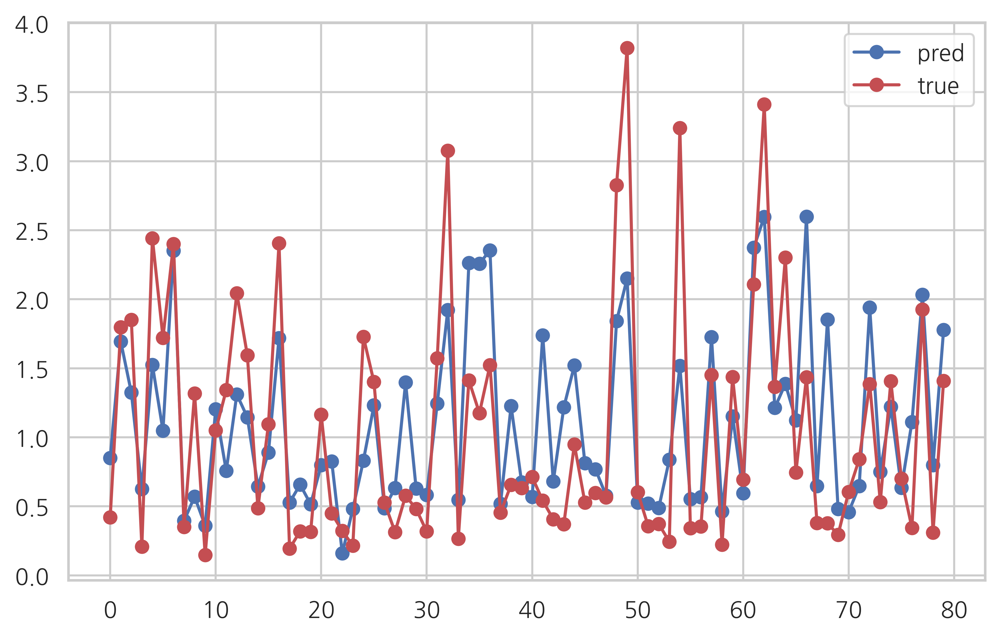

In [22]:
# 예측치 정확도
plt.plot(pred_y[0:80], "bo-", label="pred")
plt.plot(result_al["y"][0:80], "ro-", label="true")
plt.legend()
plt.show()

In [29]:
# window size에 따른 학습 값과 검증 값 반환하는 함수
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

def window_reg(window_size):
    
    n_window = df_power.shape[0]-window_size+1
    X, Y = [], []

    for w in range(n_window - 1):
        X.append(df_power[w:w+window_size])
        Y.append(df_power[w+window_size, 0])
    X, Y = np.asarray(X), np.asarray(Y)
    
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=0)

    X_train_f, X_test_f = [], []
    for r in range(X_train.shape[0]):
        X_train_f.append(X_train[r].flatten())
    for r in range(X_test.shape[0]):
        X_test_f.append(X_test[r].flatten())
    X_train_f, X_test_f = np.asarray(X_train_f), np.asarray(X_test_f)   

    model = LinearRegression(fit_intercept=False)
    model = model.fit(X_train_f, Y_train)
    
    return model.score(X_train_f, Y_train), model.score(X_test_f, Y_test)

In [30]:
data = pd.Series([window_reg(x)[0] for x in range(150,180)], index = range(150,180))
data1 = pd.Series([window_reg(x)[1] for x in range(150,180)], index = range(150,180))

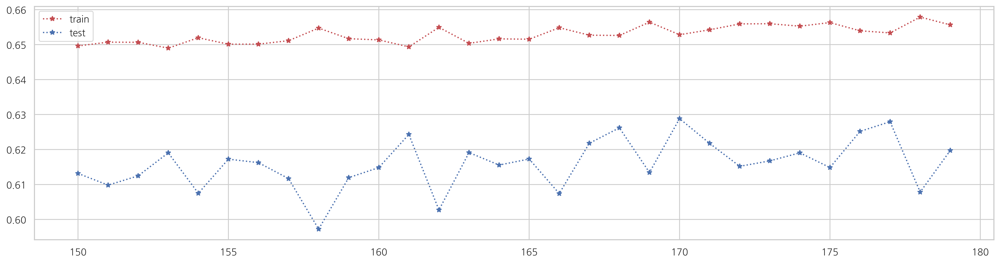

In [31]:
# 학습 값과 검증값을 함께 높일 수 있는 window size 범위 150~180 제안
plt.figure(figsize=(20, 5))
plt.plot(data, "r*:", label="train")
plt.plot(data1, "b*:", label="test")
plt.legend(loc=0)
plt.show()

In [ ]:
# 예측치 정확도
plt.plot(pred_y[0:80], "bo-", label="pred")
plt.plot(result_al["y"][0:80], "ro-", label="true")
plt.legend()
plt.show()

### 5.2 Regression Tree

In [32]:
from sklearn.tree import DecisionTreeRegressor

regtree = DecisionTreeRegressor(max_depth=10)
regtree.fit(X_train_f,  Y_train)

DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [34]:
pred_y = regtree.predict(X_test_f)
pred_y

array([1.12751305, 0.74496667, 0.91375482, ..., 0.81925676, 1.09599701,
       1.09599701])

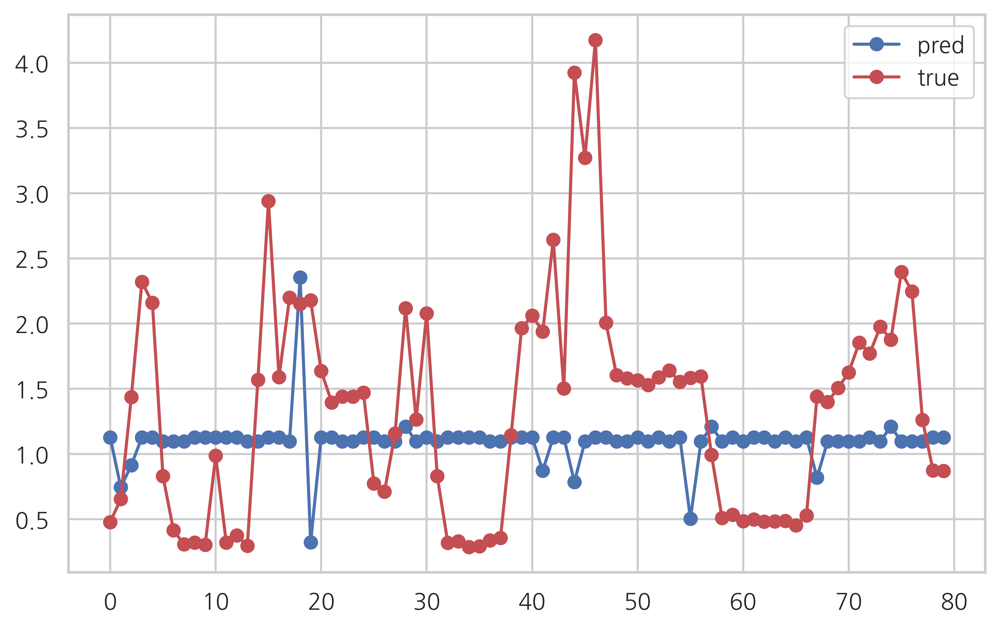

In [41]:
plt.plot(pred_y[0:80], "bo-", label="pred")
plt.plot(Y_test[0:80], "ro-", label="true")
plt.legend()
plt.show()

### 5.3 PLS regression

In [ ]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
# PLS regression
pls = PLSRegression(n_components=25)
# Fit
pls.fit(X_train_f, Y_train)
# Cross-validation
y_cv = cross_val_predict(pls, X_train_f, Y_train, cv=10)
# Calculate scores
score = r2_score(Y_train, y_cv)
mse = mean_squared_error(Y_train, y_cv)